<a href="https://colab.research.google.com/github/ImHarshhh/Dog-Vision/blob/main/Dog_Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


🐶 End to End Multi-Class Dog Breed Classification

---
1.Problem

2.Data

3.Evaluation

4.Features



In [ ]:
# Import Tensor FLow

import tensorflow as tf
import tensorflow_hub as hub

print("TF version:",tf.__version__)
print("TF_HUb:",hub.__version__)



#Checking GPU availability

print("GPU","available" if tf.config.list_physical_devices("GPU") else " not available :(" )



TF version: 2.12.0
TF_HUb: 0.13.0
GPU available


#### Converting Data into Tensors(Numerical Representation)

In [ ]:
import pandas as pd
labels_csv =pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

FileNotFoundError: ignored

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# How many images are there per breed
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

<Axes: >

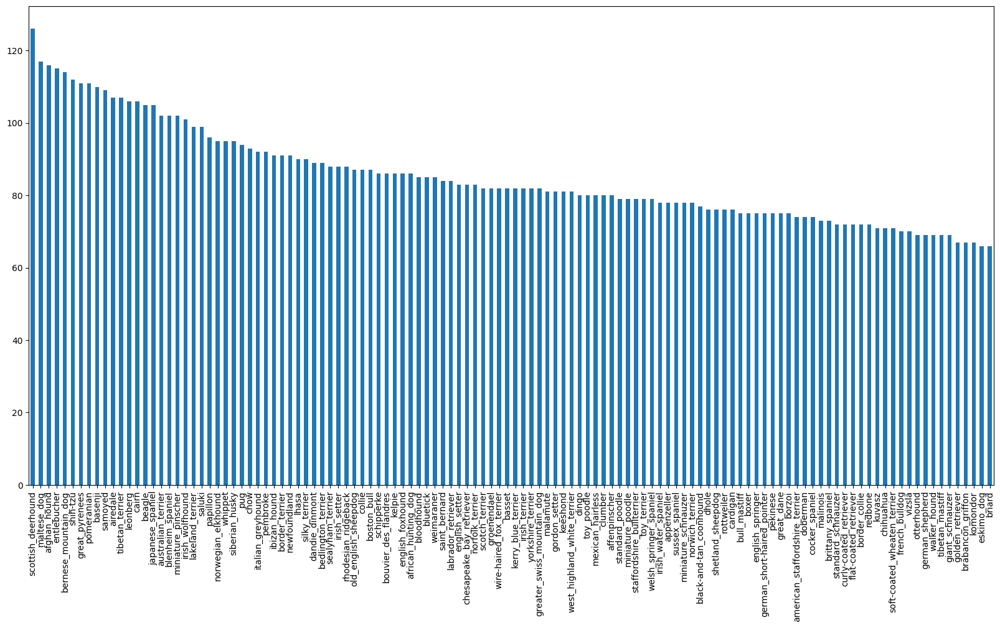

In [ ]:
# How many images are there per breed
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

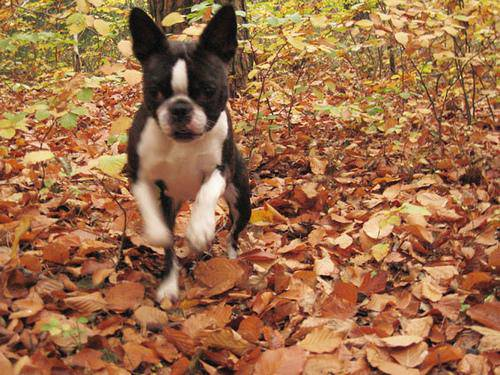

In [ ]:
from IPython.display import Image,display
display(Image("drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg"))



---



In [ ]:

labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image
filename = [ "drive/My Drive/Dog Vision/train/"+fname +".jpg" for fname in labels_csv["id"]]

filename

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/My Drive/Dog Vision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/My Drive/Dog Vision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/My Drive/Dog Vision/train/00693b8bc2470375cc744a6391d397ec.jpg',
 'drive/My Drive/Dog Vision/train/006cc3ddb9dc1bd82

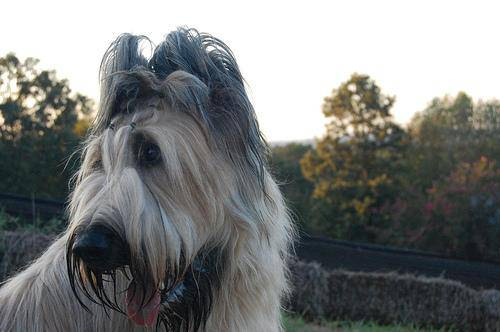

In [ ]:
Image(filename[9050])

In [ ]:
labels_csv["breed"][9050]

'briard'

In [ ]:
#Creating Labels

import numpy as np

labels=labels_csv["breed"]


In [ ]:
labels=np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# Checking if theres missing data
if len(labels) == len(filename):
  print("No missing data")

No missing data


In [ ]:
unique_breeds= np.unique(labels)
unique_breeds

len(unique_breeds)


120

In [ ]:
#Turn label into booleans

boolean_labels= [label== unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
#Converting the above true and false array into integers

print(labels[0])
print(boolean_labels[0].astype(int))

boston_bull
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
### Creating our own Validation Set
x= filename
y=boolean_labels

# We are starting with 1000 smaple then we will increase the datasets

NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1}

In [ ]:
# Train and Test Sets

from sklearn.model_selection import train_test_split

x_train,x_val,y_train,y_val = train_test_split(x[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=42)

len(x_train),len(x_val),len(y_train),len(y_val)


(800, 200, 800, 200)

In [ ]:
x_train[:2]

['drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
 'drive/My Drive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg']

In [ ]:
y_train[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,  True,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
#Preprocessing Images into Tensors

In [ ]:
#Comvert image to NumPy Array

from matplotlib.pyplot import imread
image = imread(filename[42])
image.shape

(257, 350, 3)

In [ ]:
# Turn image into Tensor   colors in RGB
tf.constant(image)[:2]


<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

## Function for Preprocessing


In [ ]:
# Define IMAGE shape
IMG_SIZE = 224

# Create a function for preprocessing

def process_image(image_path,img_size=IMG_SIZE):

  image = tf.io.read_file(image_path)   # Reading file as tensors
  image = tf.image.decode_jpeg(image,channels=3)   # Converting images into Tensors in RGB colors
  image = tf.image.convert_image_dtype(image,tf.float32)   # Converting 0-255 to  0-1 coz of normalization
  image = tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])  # Resizing the image in same size

  return image

## Turning our Data into Batches

In [ ]:
# COnverting into tuple of image and label

def get_image_label(image_path, label):
  image = process_image(image_path)
  return image,label

In [ ]:
process_image(x[42],tf.constant(y[42]))

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117757],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 ],
        [0.01

Turning data into tuple of Tensors

In [ ]:
# Define Batch SIze

BATCH_SIZE = 32

# Creating a function to convert data into batches
def create_data_batches(x,y=None , batch_size =BATCH_SIZE , valid_data=False , test_data=False):
  if test_data:
    print("Creating test data batches ....")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)

    return data_batch

  elif valid_data:
    print("Creating validation data batches ....")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)

    return data_batch

  else:
    print("Creating train data batches ....")

    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
    data = data.shuffle(buffer_size = len(x))
    data = data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)


  return data_batch





In [ ]:
# Creating training and validation data batches

train_data = create_data_batches(x_train,y_train)
val_data = create_data_batches(x_val,y_val,valid_data = True)

Creating train data batches ....
Creating validation data batches ....


In [ ]:
# Checking out different attribute
train_data.element_spec , val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

In [ ]:
import matplotlib.pyplot as plt

def show_25_images(images ,labels):

  plt.figure(figsize=(10,10))

  for i in range(25):

    ax = plt.subplot(5,5,i+1)

    plt.imshow(images[i])

    plt.title(unique_breeds[labels[i].argmax()])

    plt.axis("Off")




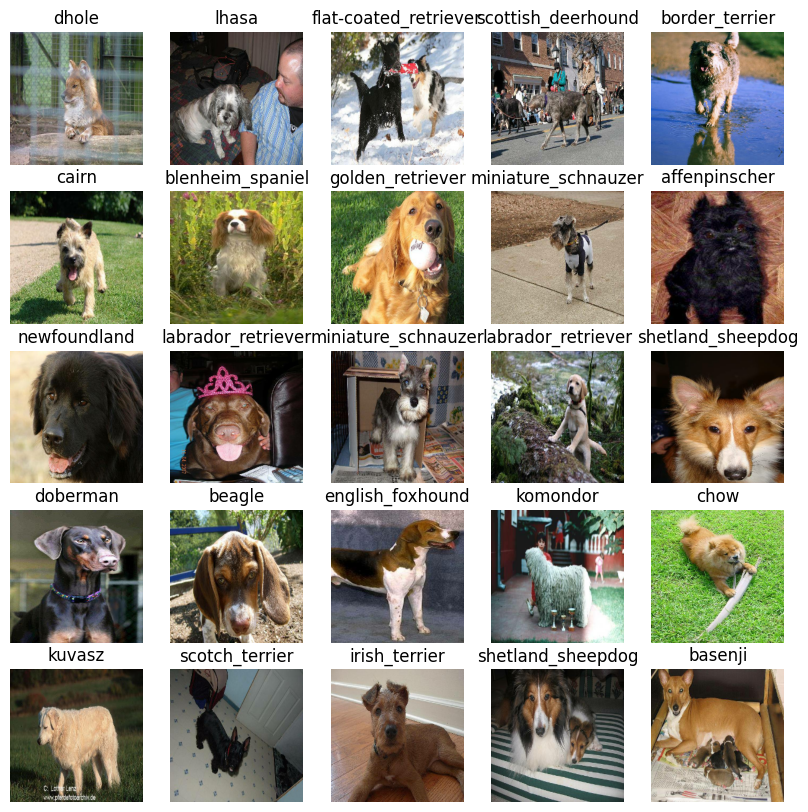

In [ ]:
train_images,train_labels = next(train_data.as_numpy_iterator())

show_25_images(train_images , train_labels)



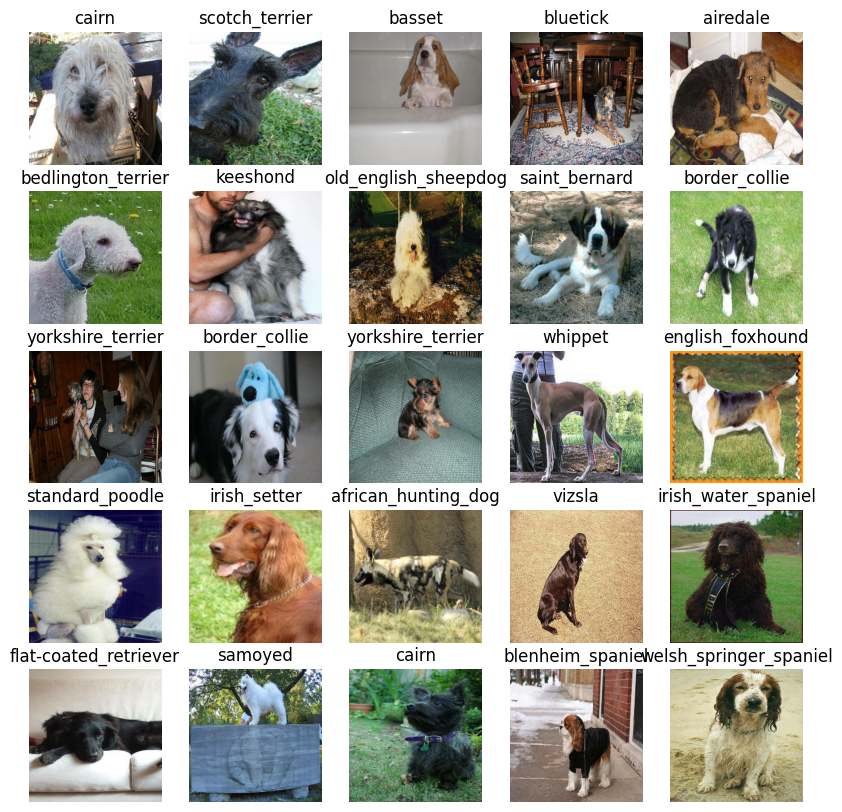

In [ ]:
# Now let's visualize validation set

val_images,val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images , val_labels)



# Building a Model

In [ ]:
#Setup input Shape

INPUT_SHAPE = [None , IMG_SIZE , IMG_SIZE , 3]

OUTPUT_SHAPE = len(unique_breeds)

#Setup model URL TensorFLow HUB

MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

###Keras Deep Learning Model

In [ ]:
# Create a function which builds Keras Model

def create_model(input_shape= INPUT_SHAPE,output_shape= OUTPUT_SHAPE , model_url = MODEL_URL):
  print("Building modelr with:",MODEL_URL)

  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),
      tf.keras.layers.Dense(units = OUTPUT_SHAPE, activation="softmax")
  ])

  # Compiling the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Building a Model
  model.build(INPUT_SHAPE)

  return model



In [ ]:
model = create_model()
model.summary()

Building modelr with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


### Call BAcks
* Checks progress
* Saves Progress
* Stop when there is no improvement in model


### TensorBoaard Callback ( Track Models Progress)

In [ ]:
# load tensorboard callback

%load_ext tensorboard

In [ ]:
import datetime
import os

# Create a function to build a TensorBoard CallBack

def create_tensorboard_callback():

  # Create a log directory

  logdir = os.path.join("drive/My Drive/Dog Vision/logs",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logdir)




### Early Stoppiing CallBAck (Stops model from overfitting when our Model is not Improving)

In [ ]:
# Create early stopping callbacks

early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)

## Training A Model (on Subset of Data)

In [ ]:
# Epochs is basically the number of times the model looks at the training data before validating or testing the model

NUM_EPOCHS = 100 #@param {type:"slider",min:10,max:100,step:10}



## Create a function to train a model


In [ ]:
def train_model():

  # Create model

  model = create_model()

  # Create new TensorBoard session everytime we train a model

  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passinf it the callbacks we created

  model.fit(x=train_data , epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard , early_stopping])

  # Return the fitted model

  return model





In [ ]:
# Fit the model to the data

model = train_model()

Building modelr with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 374s 15s/step - loss: 4.5783 - accuracy: 0.0875 - val_loss: 3.5177 - val_accuracy: 0.2600
Epoch 2/100
25/25 [==============================] - 3s 117ms/step - loss: 1.6153 - accuracy: 0.6875 - val_loss: 2.2309 - val_accuracy: 0.5000
Epoch 3/100
25/25 [==============================] - 3s 114ms/step - loss: 0.5624 - accuracy: 0.9400 - val_loss: 1.7249 - val_accuracy: 0.5800
Epoch 4/100
25/25 [==============================] - 4s 148ms/step - loss: 0.2534 - accuracy: 0.9900 - val_loss: 1.5507 - val_accuracy: 0.6100
Epoch 5/100
25/25 [==============================] - 3s 117ms/step - loss: 0.1475 - accuracy: 0.9962 - val_loss: 1.4621 - val_accuracy: 0.6300
Epoch 6/100
25/25 [==============================] - 3s 117ms/step - loss: 0.1007 - accuracy: 0.9987 - val_loss: 1.4208 - val_accuracy: 0.6300
Epoch 7/100
25/25 [=============================

In [ ]:

# Checking the TensorBoard logs

%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and Evaluating Prediction

In [ ]:
 # Make prediction on validation set ( practice exams)

 predictions = model.predict(val_data , verbose=1)
 predictions

7/7 [==============================] - 3s 96ms/step


array([[2.1150620e-03, 2.7146115e-04, 5.1697772e-03, ..., 1.9576261e-04,
        4.6156620e-05, 7.2159939e-03],
       [6.6132601e-03, 1.7404405e-03, 3.1726260e-02, ..., 1.3461270e-03,
        9.0332213e-04, 1.1203672e-03],
       [4.5106335e-05, 2.6087885e-04, 1.9761277e-05, ..., 1.9698076e-05,
        4.9907736e-05, 1.1181687e-04],
       ...,
       [2.1657321e-05, 2.8035716e-05, 1.4202086e-04, ..., 8.1023027e-06,
        3.7931060e-04, 2.0714257e-05],
       [4.3813791e-03, 5.5932446e-04, 4.7320072e-04, ..., 7.2680254e-05,
        1.1833221e-05, 7.0639830e-03],
       [1.1606949e-03, 8.5705688e-05, 3.4671847e-03, ..., 5.4094302e-03,
        9.5365412e-04, 7.3397423e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
np.max(predictions[0])

0.21799313

In [ ]:
index = 43
print(predictions[0])
print(f"Max value ( probabilty of prediction ) : {np.max(predictions[index])}")
print(f"Sum : {np.sum(predictions[index])}")
print(f"Max index : {np.argmax(predictions[index])}")
print(f"Predicted label : {unique_breeds[np.argmax(predictions[index])]}")




[2.11506197e-03 2.71461147e-04 5.16977720e-03 4.36415896e-04
 6.18933642e-04 2.93703284e-04 4.38554958e-02 1.44478655e-03
 1.16370749e-04 1.05509174e-03 9.38019832e-04 3.84446321e-05
 5.30652062e-04 1.89020633e-04 1.30022794e-03 7.07141822e-04
 6.79254415e-04 1.23792887e-01 5.31219412e-05 1.06819331e-04
 2.45596957e-03 4.22485260e-04 4.07972810e-04 7.92628445e-04
 3.14040299e-05 3.25463945e-04 2.17993125e-01 2.05486213e-04
 8.46008305e-04 2.17017558e-04 8.86113266e-05 7.98519421e-03
 5.73392492e-03 1.50885389e-05 4.74806671e-04 5.12878783e-02
 5.71086093e-05 5.03840810e-03 1.30993149e-05 1.87666665e-04
 1.70505943e-03 7.97630855e-05 5.71776880e-04 3.69422225e-04
 8.33282975e-05 3.98502918e-03 2.89228163e-04 2.56016525e-03
 5.08197816e-04 4.69127554e-04 4.75583191e-04 3.97101714e-04
 6.76874013e-04 6.02579385e-05 4.07143176e-04 6.89095905e-05
 2.46443582e-04 9.00751969e-04 5.76907187e-04 7.15368763e-02
 5.09157893e-04 5.55877596e-05 3.82595084e-04 1.46994222e-04
 5.50790632e-04 4.851540

### Prediction Probabilities into respective Labels

In [ ]:
def get_pred_label(prediction_probabilities,n):


  return unique_breeds[np.argmax(predictions[n])]



In [ ]:
pred_label = get_pred_label(predictions[33],n=33)
pred_label

'mexican_hairless'

#### Unbatch the batched Dataset

In [ ]:
#Create a function to unbatch a data set

def unbatchify(data):
  images = []
  labels = []
  #Loop through unbatched data
  for image,label in val_data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images , labels



# Unbatchify the validation data
val_images , val_labels = unbatchify(val_data)
val_images[0] ,val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

### Visualising our Prediction

In [ ]:
def plot_pred (predictions_probabilities,images,labels,n):
  pred_prob,true_label,image = predictions_probabilities[n],labels[n],images[n]

  # Get pred label
  pred_label = get_pred_label(pred_prob,n)


  # PLot image and remove the ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Colour
  if pred_label == true_label :
    color = "green"

  else:
    color = "red"

  # Change plot title as predicted label , probability and truth label

  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label,
                                    ),color=color)




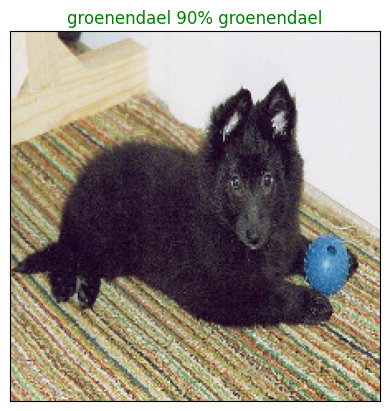

In [ ]:
plot_pred(predictions_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

#### Visualising the predictions ( top 10 )

In [ ]:
def plot_pred_conf(predictions_probabilities , labels , n=1):

  pred_prob,true_label = predictions_probabilities[n],labels[n]

  # Get predicted label

  pred_label = get_pred_label(pred_prob , n)

  # Find top 10 predictions indexes

  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction values

  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find top 10 prediction labels

  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Ploting

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
                     labels = top_10_pred_labels,
                     rotation ="vertical")

  if np.isin(true_label , top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")

  else:
    pass





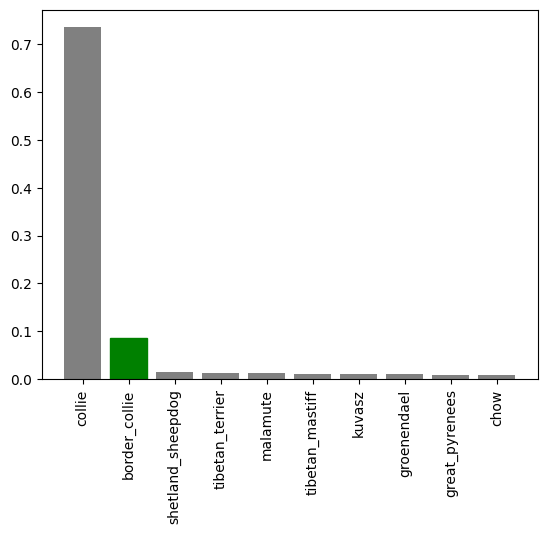

In [ ]:
plot_pred_conf(predictions_probabilities=predictions,
               labels = val_labels,
               n=9
               )

### Visualising the prediction is more detailed manner

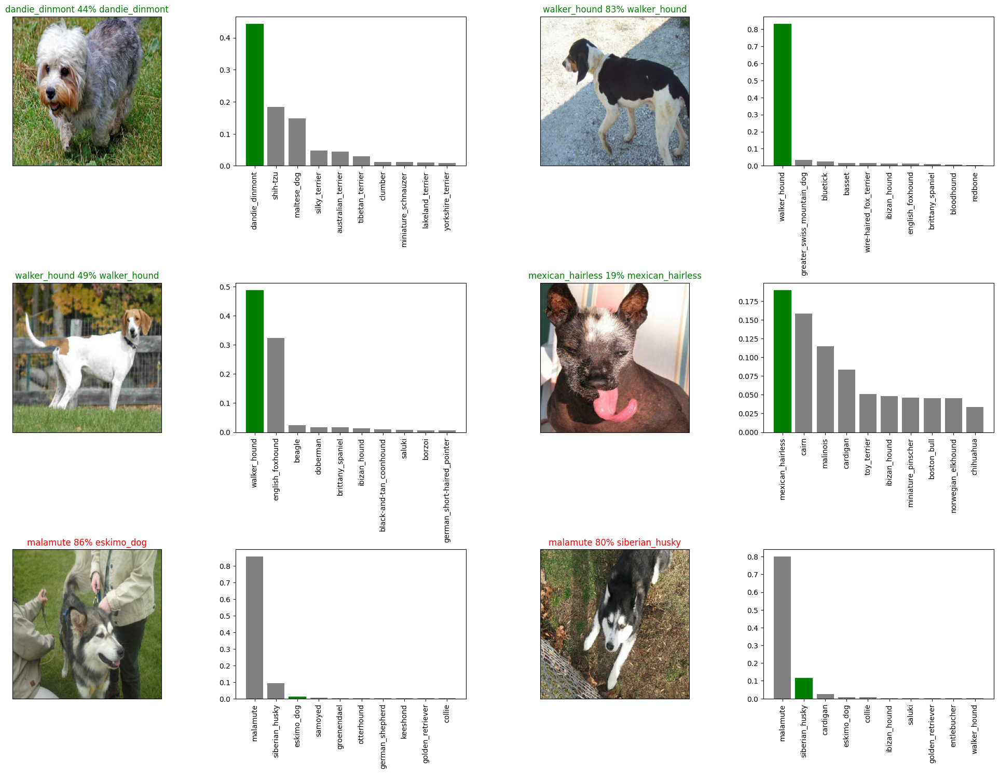

In [ ]:
# Check top predictions with their images

i_multiplier = 30
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols

plt.figure(figsize=(10*num_cols , 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows , 2*num_cols , 2*i+1)
  plot_pred(predictions_probabilities= predictions,
            labels = val_labels,
            images = val_images,
            n = i+i_multiplier)
  plt.subplot(num_rows , 2*num_cols , 2*i+2)
  plot_pred_conf(predictions_probabilities= predictions,
                 labels = val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad = 1.0)
plt.show()

### Saving Our Model

In [ ]:
# Dreatinf a fucntion to save a model

def save_model(model, suffix =None):

  # Create a modeldirectory pathname with current time

  modeldir = os.path.join("drive/My Drive/Dog Vision/models",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "=" + suffix + ".h5"  # format of saving model
  print(f"SAving model to : {model_path}.....")
  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):

  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model for 1000 images

save_model(model,suffix="1000-images-mobilnetV2-Adam-p3")

SAving model to : drive/My Drive/Dog Vision/models/20230623-081343=1000-images-mobilnetV2-Adam-p3.h5.....


'drive/My Drive/Dog Vision/models/20230623-081343=1000-images-mobilnetV2-Adam-p3.h5'

In [ ]:
# Loading trained Model

loaded_1000_image_model = load_model("drive/My Drive/Dog Vision/models/20230622-211240=1000-images-mobilnetV2-Adam-p2.h5")

Loading saved model from: drive/My Drive/Dog Vision/models/20230622-211240=1000-images-mobilnetV2-Adam-p2.h5


In [ ]:
# Evaluate the pre-save model
model.evaluate(val_data)

7/7 [==============================] - 1s 147ms/step - loss: 1.3129 - accuracy: 0.6500


[1.3129067420959473, 0.6499999761581421]

In [ ]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 85ms/step - loss: 1.3984 - accuracy: 0.6150


[1.3983945846557617, 0.6150000095367432]

In [ ]:
full_data = create_data_batches(x,y)


Creating train data batches ....


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model = create_model()

Building modelr with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# CallBacks
full_model_tensorboard = create_tensorboard_callback()

full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "accuracy",
                                                             patience = 3)



In [ ]:
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks = [full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 3559s 11s/step - loss: 1.3215 - accuracy: 0.6735
Epoch 2/100
320/320 [==============================] - 37s 115ms/step - loss: 0.3948 - accuracy: 0.8825
Epoch 3/100
320/320 [==============================] - 33s 103ms/step - loss: 0.2359 - accuracy: 0.9378
Epoch 4/100
320/320 [==============================] - 33s 103ms/step - loss: 0.1533 - accuracy: 0.9629
Epoch 5/100
320/320 [==============================] - 33s 104ms/step - loss: 0.1058 - accuracy: 0.9800
Epoch 6/100
320/320 [==============================] - 33s 104ms/step - loss: 0.0767 - accuracy: 0.9880
Epoch 7/100
320/320 [==============================] - 35s 108ms/step - loss: 0.0601 - accuracy: 0.9897
Epoch 8/100
320/320 [==============================] - 42s 130ms/step - loss: 0.0466 - accuracy: 0.9941
Epoch 9/100
320/320 [==============================] - 41s 127ms/step - loss: 0.0374 - accuracy: 0.9958
Epoch 10/100
320/320 [==============================] - 46s 145m

In [ ]:
save_model(full_model , suffix="full-image-set-mobilenetv2-Adam")


SAving model to : drive/My Drive/Dog Vision/models/20230623-093718=full-image-set-mobilenetv2-Adam.h5.....
Loading saved model from: drive/My Drive/Dog Vision/models/20230623-093627=full-image-set-mobilenetv2-Adam.h5


In [ ]:
loaded_full_model = load_model('drive/My Drive/Dog Vision/models/20230623-093627=full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/My Drive/Dog Vision/models/20230623-093627=full-image-set-mobilenetv2-Adam.h5


## Making prediction on Test DataSet

In [ ]:
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e380bd4f8375d09ae72f4f36aa610031.jpg',
 'drive/MyDrive/Dog Vision/test/e7f95aabf775a636b3893ffa120adaf9.jpg',
 'drive/MyDrive/Dog Vision/test/e07106e5301fbce05cade5c94f775a72.jpg',
 'drive/MyDrive/Dog Vision/test/e774fbfeb4b712ca042f93edea3835af.jpg',
 'drive/MyDrive/Dog Vision/test/e2f94ad185a2cfa2311c66c3e8bdba17.jpg',
 'drive/MyDrive/Dog Vision/test/dd026c42cfd91ea64b1fe5db04a18863.jpg',
 'drive/MyDrive/Dog Vision/test/e3f04efb648b110b2eb04b9c041504d8.jpg',
 'drive/MyDrive/Dog Vision/test/df38352b1f41c92d6750b87b55488ed4.jpg',
 'drive/MyDrive/Dog Vision/test/e22db0abd7c039726b9683fc0a372204.jpg',
 'drive/MyDrive/Dog Vision/test/ee3b0ea1f7649dbc3a5724ebccdff863.jpg']

In [ ]:
test_data = create_data_batches(test_filenames, test_data = True)

Creating test data batches ....


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
%ls

drive/  sample_data/


In [ ]:
%ls drive/MyDrive/Dog\ Vision/

'dog-breed-identification (1).zip'   logs/     sample_submission.csv   train/
 labels.csv                          models/   test/


In [ ]:
test_prediction = loaded_full_model.predict(test_data,verbose =1)

324/324 [==============================] - 206s 597ms/step


In [ ]:
np.savetxt("drive/My Drive/Dog Vision/preds_array.csv",test_prediction ,delimiter = "," )



In [ ]:
test_prediction = np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv",delimiter = "," )

In [ ]:
# Creating our prediction in tables

preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]

In [ ]:
preds_df["id"] = test_ids

In [ ]:
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e380bd4f8375d09ae72f4f36aa610031,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e7f95aabf775a636b3893ffa120adaf9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e07106e5301fbce05cade5c94f775a72,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e774fbfeb4b712ca042f93edea3835af,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e2f94ad185a2cfa2311c66c3e8bdba17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10360,07cbc12094a8f4a54700054222a25da3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10361,07e56f8e36196be69405e4c524c99b98,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10362,084a88db5888d01ee4cdc4607f461ee5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10363,0745215532a68e30976e45ea0389ea61,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Adding prediction probabilities to each columns

preds_df[list(unique_breeds)] = test_prediction
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e380bd4f8375d09ae72f4f36aa610031,3.951411e-09,2.283973e-08,9.834207e-10,2.262526e-10,3.931791e-08,2.611642e-10,2.849897e-07,2.633926e-08,1.193235e-09,...,7.400611e-11,5.978399e-08,2.002013e-11,2.686539e-10,8.496426e-10,1.964841e-08,1.149586e-04,2.609241e-07,6.596705e-06,3.454399e-07
1,e7f95aabf775a636b3893ffa120adaf9,7.595934e-01,1.552448e-09,3.492102e-09,4.104889e-12,1.575735e-08,3.714372e-10,2.636968e-07,5.011181e-09,1.098690e-09,...,5.031448e-05,3.807715e-08,5.483716e-08,2.523224e-09,1.251104e-08,2.347823e-10,2.815508e-10,9.692348e-11,1.845321e-07,3.093990e-05
2,e07106e5301fbce05cade5c94f775a72,1.012759e-09,1.688284e-07,1.641932e-10,6.170307e-05,6.028835e-10,4.826127e-10,3.108332e-09,1.435480e-07,1.054387e-12,...,7.641810e-08,2.227626e-07,4.401968e-09,1.237520e-06,6.729036e-11,1.592285e-08,1.484831e-07,4.583110e-07,9.977429e-01,8.366195e-08
3,e774fbfeb4b712ca042f93edea3835af,1.331470e-08,4.609480e-10,9.578830e-12,4.275346e-05,2.524540e-09,4.623079e-08,3.442795e-07,3.164641e-09,8.756686e-10,...,4.881191e-09,1.405947e-08,1.313078e-06,2.681669e-10,6.943324e-11,4.243102e-09,2.427339e-10,5.413705e-07,5.817878e-06,2.327992e-09
4,e2f94ad185a2cfa2311c66c3e8bdba17,2.027625e-05,1.854507e-08,1.196493e-10,2.581929e-11,1.921761e-09,3.942578e-11,3.228056e-10,2.269352e-09,3.407430e-08,...,6.082940e-10,4.850089e-08,4.123824e-08,2.171198e-07,2.973292e-10,5.411669e-11,3.437281e-08,5.376986e-11,1.168015e-06,2.641285e-06


In [ ]:
preds_df.to_csv("drive/My Drive/Dog Vision/full_model_prediction_submission_mobilnetv2.csv",index= False)